# Import Library

In [134]:
!pip install google-play-scraper

In [135]:
from google_play_scraper import app

In [136]:
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
seed = 0
np.random.seed(seed)
import matplotlib.pyplot as plt
import seaborn as sns

import datetime as dt
import re
import string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

!pip install sastrawi
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

from wordcloud import WordCloud

import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

# Scaping Data

In [137]:
from google_play_scraper import app, reviews, Sort

In [138]:
scrapreview = reviews(
    'com.telkomsel.telkomselcm',
    lang='id',
    country='id',
    sort=Sort.MOST_RELEVANT,
    count=10500
)

print(type(scrapreview))
print(type(scrapreview[0]))
print(scrapreview[0])

<class 'tuple'>
<class 'list'>
[{'reviewId': '71fd1e8e-029c-4425-b2f6-23c774b7ed3e', 'userName': 'Pengguna Google', 'userImage': 'https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g', 'content': 'Sudah banyak yg ngeluh ini aplikasi lemot parah sering crash kok ga dibenerin udah lama masalah ini! Sekelas telkom yg katanya no 1 kok sekarang jadi dibawah indosat? Berbanding jauh sama aplikasi Bima+ yg ringan ga lemot kek gini..Udah coba berbagai cara dan sampai install ulang tetap aja lelet.. Kualitas sinyal juga ga nentu, kualitas aplikasi juga buruk lelet kita mau beli paket data ataupun cek data pun dipersulit freeze menu ga bisa di klik berujung close app! Tolong dengar pelangganmu!', 'score': 1, 'thumbsUpCount': 2, 'reviewCreatedVersion': '8.7.0', 'at': datetime.datetime(2025, 4, 30, 15, 18, 54), 'replyContent': None, 'repliedAt': None, 'appVersion': '8.7.0'}, {'reviewId': '2c8e0f86-7cee-424d-a7ee-1bbf832a8de5', 'us

In [139]:
import csv

with open('Dataset hasil scraping.csv', mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)
    writer.writerow(['Review'])
    list_of_reviews, continuation_token = scrapreview
    for review in list_of_reviews:
        writer.writerow([review['content']])

# Loading Dataset

In [140]:
app_reviews_df = pd.DataFrame(list_of_reviews)
app_reviews_df.shape
app_reviews_df.head()
app_reviews_df.to_csv('Dataset hasil scraping.csv', index=False)

jumlah_ulasan, jumlah_kolom = app_reviews_df.shape

In [141]:
app_reviews_df.head()

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,71fd1e8e-029c-4425-b2f6-23c774b7ed3e,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"Sudah banyak yg ngeluh ini aplikasi lemot parah sering crash kok ga dibenerin udah lama masalah ini! Sekelas telkom yg katanya no 1 kok sekarang jadi dibawah indosat? Berbanding jauh sama aplikasi Bima+ yg ringan ga lemot kek gini..Udah coba berbagai cara dan sampai install ulang tetap aja lelet.. Kualitas sinyal juga ga nentu, kualitas aplikasi juga buruk lelet kita mau beli paket data ataupun cek data pun dipersulit freeze menu ga bisa di klik berujung close app! Tolong dengar pelangganmu!",1,2,8.7.0,2025-04-30 15:18:54,None,NaT,8.7.0
1,2c8e0f86-7cee-424d-a7ee-1bbf832a8de5,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"tidak perlu munculkan popup utk membeli paket, sangat menyebalkan. Pengguna otomatis akan membeli paket jika habis. Popup yang muncul sudah menyerupai dept collector, sangat mengganggu pengguna😭 makin malam makin lambat ini aplikasi, cuma ngecek paket data aja lama sekali terkadang malah macet",1,1701,8.7.0,2025-05-04 01:01:07,"Makasih ya Kak Masmo untuk masukannya, berharga banget untuk pengembangan versi MyTelkomsel selanjutnya. Terus pakai nomor Telkomselnya ya Kak. Salam sukses selalu :) -Ghia",2020-09-22 11:24:48,8.7.0
2,7554336f-d8fa-4bca-955b-e7ee03e0de8c,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"terlalu banyak fitur gak berguna di MyTelkomsel, aplikasi jadi berat, loading jadi terlalu lambat, mending kalo mau tambah fitur lifestyle buat aplikasi baru aja deh, parah banget ini loadingnya soalnya. dan untuk kualitas jaringan kok sekarang jadi jelek banget ya. atau perbedaan pembelian paket data berpengaruh pada kualitas sinyal? hipotesis aja sih, tapi kok kyknya iya 🧐",1,2202,8.7.0,2025-05-01 00:42:26,"Hai Kak Fahri. Maaf bikin gak nyaman, apabila aplikasi MyTelkomsel terlalu berat di handphone kakak, silakan coba unduh MyTelkomsel Basic. Aplikasi ini sudah tersedia di PlayStore. Untuk keluhan sinyal, silakan coba restart handphone Kakak. Jika masih berkendala, yuk hubungi kami di DM Instagram @telkomsel atau chat di tsel.id/chatva. -Sekar",2025-05-01 01:28:51,8.7.0
3,998ddb17-949d-49af-8125-536f632db582,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"aplikasi my telkomsel memang yg paling busuk dibanding aplikasi punya operator sebelah seperti Axisnet. Tiba-tiba logout kirain lagi maintenance atau ada update besar (paling update fitur gaje yg bikin tambah berat) ternyata mau login lagi ga bisa, link verifikasi tidak berfungsi muncul notif ""terjadi kesalahan, silahkan ulangi kembali"". Udahlah ga usah bikin macem-macem, aplikasinya tinggal dibikin jadi tempat transaksi beres, ga usah yapping ini itu.",1,219,8.7.0,2025-05-14 23:28:30,"Hai Kak Abdillah. Mohon maaf untuk ketidaknyamanannya. Sebelum mencoba login kembali, silakan restart handphone Kakak. Apabila tetap mengalami kesulitan login, bisa hubungi kami melalui DM Instagram @telkomsel atau chat di tsel.id/chatva. Semoga membantu. 😊 -Sekar",2025-05-15 05:44:09,8.7.0
4,ee1e41d4-ea1f-4096-b0f3-884b74274b6e,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"Harga ELIT jaringan SULIT. KUOTA SERBA MAHAL NGGAK NGOTAK tapi jaringannya hilang muncul, jaringan internet LELET BANGET, Reward tukar poin banyak yang tidak berguna, produk Reward sedikit sekali dan sekalinya redeem tiba-tiba dapet notif ""Maaf, Penukaran untuk Program ini tidak berhasil"" poin direfund tapi gak bisa klaim reward lagi gak ada penjelasan s

In [142]:
app_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10500 entries, 0 to 10499
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   reviewId              10500 non-null  object        
 1   userName              10500 non-null  object        
 2   userImage             10500 non-null  object        
 3   content               10500 non-null  object        
 4   score                 10500 non-null  int64         
 5   thumbsUpCount         10500 non-null  int64         
 6   reviewCreatedVersion  10315 non-null  object        
 7   at                    10500 non-null  datetime64[ns]
 8   replyContent          6274 non-null   object        
 9   repliedAt             6274 non-null   datetime64[ns]
 10  appVersion            10315 non-null  object        
dtypes: datetime64[ns](2), int64(2), object(7)
memory usage: 902.5+ KB


In [143]:
clean_df = app_reviews_df.dropna()

In [144]:
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6187 entries, 1 to 10499
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   reviewId              6187 non-null   object        
 1   userName              6187 non-null   object        
 2   userImage             6187 non-null   object        
 3   content               6187 non-null   object        
 4   score                 6187 non-null   int64         
 5   thumbsUpCount         6187 non-null   int64         
 6   reviewCreatedVersion  6187 non-null   object        
 7   at                    6187 non-null   datetime64[ns]
 8   replyContent          6187 non-null   object        
 9   repliedAt             6187 non-null   datetime64[ns]
 10  appVersion            6187 non-null   object        
dtypes: datetime64[ns](2), int64(2), object(7)
memory usage: 580.0+ KB


In [145]:
clean_df = clean_df.drop_duplicates()

jumlah_ulasan_bersih, jumlah_kolom_bersih = clean_df.shape

## Preprocessing

In [146]:
def cleaningText(text):
    text = re.sub(r'@[A-Za-z0-9]+', '', text)
    text = re.sub(r'#[A-Za-z0-9]+', '', text)
    text = re.sub(r'RT[\s]', '', text)
    text = re.sub(r"http\S+", '', text)
    text = re.sub(r'[0-9]+', '', text)
    text = re.sub(r'[^\w\s]', '', text)

    text = text.replace('\n', ' ')
    text = text.translate(str.maketrans('', '', string.punctuation))
    text = text.strip(' ')
    return text

def casefoldingText(text):
    text = text.lower()
    return text

def tokenizingText(text):
    text = word_tokenize(text)
    return text

def filteringText(text):
    stop_words = set(stopwords.words('indonesian'))
    stop_words1 = set(stopwords.words('english'))
    stop_words.update(stop_words1)
    stop_words.update(["yg", "dg", "rt", "dgn", "ny", "d", 'klo', 'kalo', 'amp', 'biar', 'bikin', 'bilang', 'ga', 'iya','yaa','gak','nya','na', 'sih','ku',"di","ya","gaa","loh","kah", "woi","woii","woy"])
    filtered = []
    for txt in text:
        if txt not in stop_words:
            filtered.append(txt)
    text = filtered
    return text

def stemmingText(text):
    factory = StemmerFactory()
    stemmer = factory.create_stemmer()

    words = text.split()

    stemmed_words = [stemmer.stem(word) for word in words]
    stemmed_text = ' '.join(stemmed_words)
    return stemmed_text

def toSentence(list_words):
    sentence = ' '.join(word for word in list_words)
    return sentence

In [147]:
slangwords = {"@": "di", "abis": "habis", "wtb": "beli", "masi": "masih", "wts": "jual", "wtt": "tukar", "bgt": "banget", "maks": "maksimal", "plisss": "tolong", "bgttt": "banget", "indo": "indonesia", "bgtt": "banget", "ad": "ada", "rv": "redvelvet", "plis": "tolong", "pls": "tolong", "cr": "sumber", "cod": "bayar ditempat", "adlh": "adalah", "afaik": "as far as i know", "ahaha": "haha", "aj": "saja", "ajep-ajep": "dunia gemerlap", "ak": "saya", "akika": "aku", "akkoh": "aku", "akuwh": "aku", "alay": "norak", "alow": "halo", "ambilin": "ambilkan", "ancur": "hancur", "anjrit": "anjing", "anter": "antar", "ap2": "apa-apa", "apasih": "apa sih", "apes": "sial", "aps": "apa", "aq": "saya", "aquwh": "aku", "asbun": "asal bunyi", "aseekk": "asyik", "asekk": "asyik", "asem": "asam", "aspal": "asli tetapi palsu", "astul": "asal tulis", "ato": "atau", "au ah": "tidak mau tahu", "awak": "saya", "ay": "sayang", "ayank": "sayang", "b4": "sebelum", "bakalan": "akan", "bandes": "bantuan desa", "bangedh": "banget", "banpol": "bantuan polisi", "banpur": "bantuan tempur", "basbang": "basi", "bcanda": "bercanda", "bdg": "bandung", "begajulan": "nakal", "beliin": "belikan", "bencong": "banci", "bentar": "sebentar", "ber3": "bertiga", "beresin": "membereskan", "bete": "bosan", "beud": "banget", "bg": "abang", "bgmn": "bagaimana", "bgt": "banget", "bijimane": "bagaimana", "bintal": "bimbingan mental", "bkl": "akan", "bknnya": "bukannya", "blegug": "bodoh", "blh": "boleh", "bln": "bulan", "blum": "belum", "bnci": "benci", "bnran": "yang benar", "bodor": "lucu", "bokap": "ayah", "boker": "buang air besar", "bokis": "bohong", "boljug": "boleh juga", "bonek": "bocah nekat", "boyeh": "boleh", "br": "baru", "brg": "bareng", "bro": "saudara laki-laki", "bru": "baru", "bs": "bisa", "bsen": "bosan", "bt": "buat", "btw": "ngomong-ngomong", "buaya": "tidak setia", "bubbu": "tidur", "bubu": "tidur", "bumil": "ibu hamil", "bw": "bawa", "bwt": "buat", "byk": "banyak", "byrin": "bayarkan", "cabal": "sabar", "cadas": "keren", "calo": "makelar", "can": "belum", "capcus": "pergi", "caper": "cari perhatian", "ce": "cewek", "cekal": "cegah tangkal", "cemen": "penakut", "cengengesan": "tertawa", "cepet": "cepat", "cew": "cewek", "chuyunk": "sayang", "cimeng": "ganja", "cipika cipiki": "cium pipi kanan cium pipi kiri", "ciyh": "sih", "ckepp": "cakep", "ckp": "cakep", "cmiiw": "correct me if i'm wrong", "cmpur": "campur", "cong": "banci", "conlok": "cinta lokasi", "cowwyy": "maaf", "cp": "siapa", "cpe": "capek", "cppe": "capek", "cucok": "cocok", "cuex": "cuek", "cumi": "Cuma miscall", "cups": "culun", "curanmor": "pencurian kendaraan bermotor", "curcol": "curahan hati colongan", "cwek": "cewek", "cyin": "cinta", "d": "di", "dah": "deh", "dapet": "dapat", "de": "adik", "dek": "adik", "demen": "suka", "deyh": "deh", "dgn": "dengan", "diancurin": "dihancurkan", "dimaafin": "dimaafkan", "dimintak": "diminta", "disono": "di sana", "dket": "dekat", "dkk": "dan kawan-kawan", "dll": "dan lain-lain", "dlu": "dulu", "dngn": "dengan", "dodol": "bodoh", "doku": "uang", "dongs": "dong", "dpt": "dapat", "dri": "dari", "drmn": "darimana", "drtd": "dari tadi", "dst": "dan seterusnya", "dtg": "datang", "duh": "aduh", "duren": "durian", "ed": "edisi", "egp": "emang gue pikirin", "eke": "aku", "elu": "kamu", "emangnya": "memangnya", "emng": "memang", "endak": "tidak", "enggak": "tidak", "envy": "iri", "ex": "mantan", "fax": "facsimile", "fifo": "first in first out", "folbek": "follow back", "fyi": "sebagai informasi", "gaada": "tidak ada uang", "gag": "tidak", "gaje": "tidak jelas", "gak papa": "tidak apa-apa", "gan": "juragan", "gaptek": "gagap teknologi", "gatek": "gagap teknologi", "gawe": "kerja", "gbs": "tidak bisa", "gebetan": "orang yang disuka", "geje": "tidak jelas", "gepeng": "gelandangan dan pengemis", "ghiy": "lagi", "gile": "gila", "gimana": "bagaimana", "gino": "gigi nongol", "githu": "gitu", "gj": "tidak jelas", "gmana": "bagaimana", "gn": "begini", "goblok": "bodoh", "golput": "golongan putih", "gowes": "mengayuh sepeda", "gpny": "tidak punya", "gr": "gede rasa", "gretongan": "gratisan", "gtau": "tidak tahu", "gua": "saya", "guoblok": "goblok", "gw": "saya", "ha": "tertawa", "haha": "tertawa", "hallow": "halo", "hankam": "pertahanan dan keamanan", "hehe": "he", "helo": "halo", "hey": "hai", "hlm": "halaman", "hny": "hanya", "hoax": "isu bohong", "hr": "hari", "hrus": "harus", "hubdar": "perhubungan darat", "huff": "mengeluh", "hum": "rumah", "humz": "rumah", "ilang": "hilang", "ilfil": "tidak suka", "imho": "in my humble opinion", "imoetz": "imut", "item": "hitam", "itungan": "hitungan", "iye": "iya", "ja": "saja", "jadiin": "jadi", "jaim": "jaga image", "jayus": "tidak lucu", "jdi": "jadi", "jem": "jam", "jga": "juga", "jgnkan": "jangankan", "jir": "anjing", "jln": "jalan", "jomblo": "tidak punya pacar", "jubir": "juru bicara", "jutek": "galak", "k": "ke", "kab": "kabupaten", "kabor": "kabur", "kacrut": "kacau", "kadiv": "kepala divisi", "kagak": "tidak", "kalo": "kalau", "kampret": "sialan", "kamtibmas": "keamanan dan ketertiban masyarakat", "kamuwh": "kamu", "kanwil": "kantor wilayah", "karna": "karena", "kasubbag": "kepala subbagian", "katrok": "kampungan", "kayanya": "kayaknya", "kbr": "kabar", "kdu": "harus", "kec": "kecamatan", "kejurnas": "kejuaraan nasional", "kekeuh": "keras kepala", "kel": "kelurahan", "kemaren": "kemarin", "kepengen": "mau", "kepingin": "mau", "kepsek": "kepala sekolah", "kesbang": "kesatuan bangsa", "kesra": "kesejahteraan rakyat", "ketrima": "diterima", "kgiatan": "kegiatan", "kibul": "bohong", "kimpoi": "kawin", "kl": "kalau", "klianz": "kalian", "kloter": "kelompok terbang", "klw": "kalau", "km": "kamu", "kmps": "kampus", "kmrn": "kemarin", "knal": "kenal", "knp": "kenapa", "kodya": "kota madya", "komdis": "komisi disiplin", "komsov": "komunis sovyet", "kongkow": "kumpul bareng teman-teman", "kopdar": "kopi darat", "korup": "korupsi", "kpn": "kapan", "krenz": "keren", "krm": "kirim", "kt": "kita", "ktmu": "ketemu", "ktr": "kantor", "kuper": "kurang pergaulan", "kw": "imitasi", "kyk": "seperti", "la": "lah", "lam": "salam", "lamp": "lampiran", "lanud": "landasan udara", "latgab": "latihan gabungan", "lebay": "berlebihan", "leh": "boleh", "lelet": "lambat", "lemot": "lambat", "lgi": "lagi", "lgsg": "langsung", "liat": "lihat", "litbang": "penelitian dan pengembangan", "lmyn": "lumayan", "lo": "kamu", "loe": "kamu", "lola": "lambat berfikir", "louph": "cinta", "low": "kalau", "lp": "lupa", "luber": "langsung, umum, bebas, dan rahasia", "luchuw": "lucu", "lum": "belum", "luthu": "lucu", "lwn": "lawan", "maacih": "terima kasih", "mabal": "bolos", "macem": "macam", "macih": "masih", "maem": "makan", "magabut": "makan gaji buta", "maho": "homo", "mak jang": "kaget", "maksain": "memaksa", "malem": "malam", "mam": "makan", "maneh": "kamu", "maniez": "manis", "mao": "mau", "masukin": "masukkan", "melu": "ikut", "mepet": "dekat sekali", "mgu": "minggu", "migas": "minyak dan gas bumi", "mikol": "minuman beralkohol", "miras": "minuman keras", "mlah": "malah", "mngkn": "mungkin", "mo": "mau", "mokad": "mati", "moso": "masa", "mpe": "sampai", "msk": "masuk", "mslh": "masalah", "mt": "makan teman", "mubes": "musyawarah besar", "mulu": "melulu", "mumpung": "selagi", "munas": "musyawarah nasional", "muntaber": "muntah dan berak", "musti": "mesti", "muupz": "maaf", "mw": "now watching", "n": "dan", "nanam": "menanam", "nanya": "bertanya", "napa": "kenapa", "napi": "narapidana", "napza": "narkotika, alkohol, psikotropika, dan zat adiktif ", "narkoba": "narkotika, psikotropika, dan obat terlarang", "nasgor": "nasi goreng", "nda": "tidak", "ndiri": "sendiri", "ne": "ini", "nekolin": "neokolonialisme", "nembak": "menyatakan cinta", "ngabuburit": "menunggu berbuka puasa", "ngaku": "mengaku", "ngambil": "mengambil", "nganggur": "tidak punya pekerjaan", "ngapah": "kenapa", "ngaret": "terlambat", "ngasih": "memberikan", "ngebandel": "berbuat bandel", "ngegosip": "bergosip", "ngeklaim": "mengklaim", "ngeksis": "menjadi eksis", "ngeles": "berkilah", "ngelidur": "menggigau", "ngerampok": "merampok", "ngga": "tidak", "ngibul": "berbohong", "ngiler": "mau", "ngiri": "iri", "ngisiin": "mengisikan", "ngmng": "bicara", "ngomong": "bicara", "ngubek2": "mencari-cari", "ngurus": "mengurus", "nie": "ini", "nih": "ini", "niyh": "nih", "nmr": "nomor", "nntn": "nonton", "nobar": "nonton bareng", "np": "now playing", "ntar": "nanti", "ntn": "nonton", "numpuk": "bertumpuk", "nutupin": "menutupi", "nyari": "mencari", "nyekar": "menyekar", "nyicil": "mencicil", "nyoblos": "mencoblos", "nyokap": "ibu", "ogah": "tidak mau", "ol": "online", "ongkir": "ongkos kirim", "oot": "out of topic", "org2": "orang-orang", "ortu": "orang tua", "otda": "otonomi daerah", "otw": "on the way, sedang di jalan", "pacal": "pacar", "pake": "pakai", "pala": "kepala", "pansus": "panitia khusus", "parpol": "partai politik", "pasutri": "pasangan suami istri", "pd": "pada", "pede": "percaya diri", "pelatnas": "pemusatan latihan nasional", "pemda": "pemerintah daerah", "pemkot": "pemerintah kota", "pemred": "pemimpin redaksi", "penjas": "pendidikan jasmani", "perda": "peraturan daerah", "perhatiin": "perhatikan", "pesenan": "pesanan", "pgang": "pegang", "pi": "tapi", "pilkada": "pemilihan kepala daerah", "pisan": "sangat", "pk": "penjahat kelamin", "plg": "paling", "pmrnth": "pemerintah", "polantas": "polisi lalu lintas", "ponpes": "pondok pesantren", "pp": "pulang pergi", "prg": "pergi", "prnh": "pernah", "psen": "pesan", "pst": "pasti", "pswt": "pesawat", "pw": "posisi nyaman", "qmu": "kamu", "rakor": "rapat koordinasi", "ranmor": "kendaraan bermotor", "re": "reply", "ref": "referensi", "rehab": "rehabilitasi", "rempong": "sulit", "repp": "balas", "restik": "reserse narkotika", "rhs": "rahasia", "rmh": "rumah", "ru": "baru", "ruko": "rumah toko", "rusunawa": "rumah susun sewa", "ruz": "terus", "saia": "saya", "salting": "salah tingkah", "sampe": "sampai", "samsek": "sama sekali", "sapose": "siapa", "satpam": "satuan pengamanan", "sbb": "sebagai berikut", "sbh": "sebuah", "sbnrny": "sebenarnya", "scr": "secara", "sdgkn": "sedangkan", "sdkt": "sedikit", "se7": "setuju", "sebelas dua belas": "mirip", "sembako": "sembilan bahan pokok", "sempet": "sempat", "sendratari": "seni drama tari", "sgt": "sangat", "shg": "sehingga", "siech": "sih", "sikon": "situasi dan kondisi", "sinetron": "sinema elektronik", "siramin": "siramkan", "sj": "saja", "skalian": "sekalian", "sklh": "sekolah", "skt": "sakit", "slesai": "selesai", "sll": "selalu", "slma": "selama", "slsai": "selesai", "smpt": "sempat", "smw": "semua", "sndiri": "sendiri", "soljum": "sholat jumat", "songong": "sombong", "sory": "maaf", "sosek": "sosial-ekonomi", "sotoy": "sok tahu", "spa": "siapa", "sppa": "siapa", "spt": "seperti", "srtfkt": "sertifikat", "stiap": "setiap", "stlh": "setelah", "suk": "masuk", "sumpek": "sempit", "syg": "sayang", "t4": "tempat", "tajir": "kaya", "tau": "tahu", "taw": "tahu", "td": "tadi", "tdk": "tidak", "teh": "kakak perempuan", "telat": "terlambat", "telmi": "telat berpikir", "temen": "teman", "tengil": "menyebalkan", "tepar": "terkapar", "tggu": "tunggu", "tgu": "tunggu", "thankz": "terima kasih", "thn": "tahun", "tilang": "bukti pelanggaran", "tipiwan": "TvOne", "tks": "terima kasih", "tlp": "telepon", "tls": "tulis", "tmbah": "tambah", "tmen2": "teman-teman", "tmpah": "tumpah", "tmpt": "tempat", "tngu": "tunggu", "tnyta": "ternyata", "tokai": "tai", "toserba": "toko serba ada", "tpi": "tapi", "trdhulu": "terdahulu", "trima": "terima kasih", "trm": "terima", "trs": "terus", "trutama": "terutama", "ts": "penulis", "tst": "tahu sama tahu", "ttg": "tentang", "tuch": "tuh", "tuir": "tua", "tw": "tahu", "u": "kamu", "ud": "sudah", "udah": "sudah", "ujg": "ujung", "ul": "ulangan", "unyu": "lucu", "uplot": "unggah", "urang": "saya", "usah": "perlu", "utk": "untuk", "valas": "valuta asing", "w/": "dengan", "wadir": "wakil direktur", "wamil": "wajib militer", "warkop": "warung kopi", "warteg": "warung tegal", "wat": "buat", "wkt": "waktu", "wtf": "what the fuck", "xixixi": "tertawa", "ya": "iya", "yap": "iya", "yaudah": "ya sudah", "yawdah": "ya sudah", "yg": "yang", "yl": "yang lain", "yo": "iya", "yowes": "ya sudah", "yup": "iya", "7an": "tujuan", "ababil": "abg labil", "acc": "accord", "adlah": "adalah", "adoh": "aduh", "aha": "tertawa", "aing": "saya", "aja": "saja", "ajj": "saja", "aka": "dikenal juga sebagai", "akko": "aku", "akku": "aku", "akyu": "aku", "aljasa": "asal jadi saja", "ama": "sama", "ambl": "ambil", "anjir": "anjing", "ank": "anak", "ap": "apa", "apaan": "apa", "ape": "apa", "aplot": "unggah", "apva": "apa", "aqu": "aku", "asap": "sesegera mungkin", "aseek": "asyik", "asek": "asyik", "aseknya": "asyiknya", "asoy": "asyik", "astrojim": "astagfirullahaladzim", "ath": "kalau begitu", "atuh": "kalau begitu", "ava": "avatar", "aws": "awas", "ayang": "sayang", "ayok": "ayo", "bacot": "banyak bicara", "bales": "balas", "bangdes": "pembangunan desa", "bangkotan": "tua", "banpres": "bantuan presiden", "bansarkas": "bantuan sarana kesehatan", "bazis": "badan amal, zakat, infak, dan sedekah", "bcoz": "karena", "beb": "sayang", "bejibun": "banyak", "belom": "belum", "bener": "benar", "ber2": "berdua", "berdikari": "berdiri di atas kaki sendiri", "bet": "banget", "beti": "beda tipis", "beut": "banget", "bgd": "banget", "bgs": "bagus", "bhubu": "tidur", "bimbuluh": "bimbingan dan penyuluhan", "bisi": "kalau-kalau", "bkn": "bukan", "bl": "beli", "blg": "bilang", "blm": "belum", "bls": "balas", "bnchi": "benci", "bngung": "bingung", "bnyk": "banyak", "bohay": "badan aduhai", "bokep": "porno", "bokin": "pacar", "bole": "boleh", "bolot": "bodoh", "bonyok": "ayah ibu", "bpk": "bapak", "brb": "segera kembali", "brngkt": "berangkat", "brp": "berapa", "brur": "saudara laki-laki", "bsa": "bisa", "bsk": "besok", "bu_bu": "tidur", "bubarin": "bubarkan", "buber": "buka bersama", "bujubune": "luar biasa", "buser": "buru sergap", "bwhn": "bawahan", "byar": "bayar", "byr": "bayar", "c8": "chat", "cabut": "pergi", "caem": "cakep", "cama-cama": "sama-sama", "cangcut": "celana dalam", "cape": "capek", "caur": "jelek", "cekak": "tidak ada uang", "cekidot": "coba lihat", "cemplungin": "cemplungkan", "ceper": "pendek", "ceu": "kakak perempuan", "cewe": "cewek", "cibuk": "sibuk", "cin": "cinta", "ciye": "cie", "ckck": "ck", "clbk": "cinta lama bersemi kembali", "cmpr": "campur", "cnenk": "senang", "congor": "mulut", "cow": "cowok", "coz": "karena", "cpa": "siapa", "gokil": "gila", "gombal": "suka merayu", "gpl": "tidak pakai lama", "gpp": "tidak apa-apa", "gretong": "gratis", "gt": "begitu", "gtw": "tidak tahu", "gue": "saya", "guys": "teman-teman", "gws": "cepat sembuh", "haghaghag": "tertawa", "hakhak": "tertawa", "handak": "bahan peledak", "hansip": "pertahanan sipil", "hellow": "halo", "helow": "halo", "hi": "hai", "hlng": "hilang", "hnya": "hanya", "houm": "rumah", "hrs": "harus", "hubad": "hubungan angkatan darat", "hubla": "perhubungan laut", "huft": "mengeluh", "humas": "hubungan masyarakat", "idk": "saya tidak tahu", "ilfeel": "tidak suka", "imba": "jago sekali", "imoet": "imut", "info": "informasi", "itung": "hitung", "isengin": "bercanda", "iyala": "iya lah", "iyo": "iya", "jablay": "jarang dibelai", "jadul": "jaman dulu", "jancuk": "anjing", "jd": "jadi", "jdikan": "jadikan", "jg": "juga", "jgn": "jangan", "jijay": "jijik", "jkt": "jakarta", "jnj": "janji", "jth": "jatuh", "jurdil": "jujur adil", "jwb": "jawab", "ka": "kakak", "kabag": "kepala bagian", "kacian": "kasihan", "kadit": "kepala direktorat", "kaga": "tidak", "kaka": "kakak", "kamtib": "keamanan dan ketertiban", "kamuh": "kamu", "kamyu": "kamu", "kapt": "kapten", "kasat": "kepala satuan", "kasubbid": "kepala subbidang", "kau": "kamu", "kbar": "kabar", "kcian": "kasihan", "keburu": "terlanjur", "kedubes": "kedutaan besar", "kek": "seperti", "keknya": "kayaknya", "keliatan": "kelihatan", "keneh": "masih", "kepikiran": "terpikirkan", "kepo": "mau tahu urusan orang", "kere": "tidak punya uang", "kesian": "kasihan", "ketauan": "ketahuan", "keukeuh": "keras kepala", "khan": "kan", "kibus": "kaki busuk", "kk": "kakak", "klian": "kalian", "klo": "kalau", "kluarga": "keluarga", "klwrga": "keluarga", "kmari": "kemari", "kmpus": "kampus", "kn": "kan", "knl": "kenal", "knpa": "kenapa", "kog": "kok", "kompi": "komputer", "komtiong": "komunis Tiongkok", "konjen": "konsulat jenderal", "koq": "kok", "kpd": "kepada", "kptsan": "keputusan", "krik": "garing", "krn": "karena", "ktauan": "ketahuan", "ktny": "katanya", "kudu": "harus", "kuq": "kok", "ky": "seperti", "kykny": "kayanya", "laka": "kecelakaan", "lambreta": "lambat", "lansia": "lanjut usia", "lapas": "lembaga pemasyarakatan", "lbur": "libur", "lekong": "laki-laki", "lg": "lagi", "lgkp": "lengkap", "lht": "lihat", "linmas": "perlindungan masyarakat", "lmyan": "lumayan", "lngkp": "lengkap", "loch": "loh", "lol": "tertawa", "lom": "belum", "loupz": "cinta", "lowh": "kamu", "lu": "kamu", "luchu": "lucu", "luff": "cinta", "luph": "cinta", "lw": "kamu", "lwt": "lewat", "maaciw": "terima kasih", "mabes": "markas besar", "macem-macem": "macam-macam", "madesu": "masa depan suram", "maen": "main", "mahatma": "maju sehat bersama", "mak": "ibu", "makasih": "terima kasih", "malah": "bahkan", "malu2in": "memalukan", "mamz": "makan", "manies": "manis", "mantep": "mantap", "markus": "makelar kasus", "mba": "mbak", "mending": "lebih baik", "mgkn": "mungkin", "mhn": "mohon", "miker": "minuman keras", "milis": "mailing list", "mksd": "maksud", "mls": "malas", "mnt": "minta", "moge": "motor gede", "mokat": "mati", "mosok": "masa", "msh": "masih", "mskpn": "meskipun", "msng2": "masing-masing", "muahal": "mahal", "muker": "musyawarah kerja", "mumet": "pusing", "muna": "munafik", "munaslub": "musyawarah nasional luar biasa", "musda": "musyawarah daerah", "muup": "maaf", "muuv": "maaf", "nal": "kenal", "nangis": "menangis", "naon": "apa", "napol": "narapidana politik", "naq": "anak", "narsis": "bangga pada diri sendiri", "nax": "anak", "ndak": "tidak", "ndut": "gendut", "nekolim": "neokolonialisme", "nelfon": "menelepon", "ngabis2in": "menghabiskan", "ngakak": "tertawa", "ngambek": "marah", "ngampus": "pergi ke kampus", "ngantri": "mengantri", "ngapain": "sedang apa", "ngaruh": "berpengaruh", "ngawur": "berbicara sembarangan", "ngeceng": "kumpul bareng-bareng", "ngeh": "sadar", "ngekos": "tinggal di kos", "ngelamar": "melamar", "ngeliat": "melihat", "ngemeng": "bicara terus-terusan", "ngerti": "mengerti", "nggak": "tidak", "ngikut": "ikut", "nginep": "menginap", "ngisi": "mengisi", "ngmg": "bicara", "ngocol": "lucu", "ngomongin": "membicarakan", "ngumpul": "berkumpul", "ni": "ini", "nyasar": "tersesat", "nyariin": "mencari", "nyiapin": "mempersiapkan", "nyiram": "menyiram", "nyok": "ayo", "o/": "oleh", "ok": "ok", "priksa": "periksa", "pro": "profesional", "psn": "pesan", "psti": "pasti", "puanas": "panas", "qmo": "kamu", "qt": "kita", "rame": "ramai", "raskin": "rakyat miskin", "red": "redaksi", "reg": "register", "rejeki": "rezeki", "renstra": "rencana strategis", "reskrim": "reserse kriminal", "sni": "sini", "somse": "sombong sekali", "sorry": "maaf", "sosbud": "sosial-budaya", "sospol": "sosial-politik", "sowry": "maaf", "spd": "sepeda", "sprti": "seperti", "spy": "supaya", "stelah": "setelah", "subbag": "subbagian", "sumbangin": "sumbangkan", "sy": "saya", "syp": "siapa", "tabanas": "tabungan pembangunan nasional", "tar": "nanti", "taun": "tahun", "tawh": "tahu", "tdi": "tadi", "te2p": "tetap", "tekor": "rugi", "telkom": "telekomunikasi", "telp": "telepon", "temen2": "teman-teman", "tengok": "menjenguk", "terbitin": "terbitkan", "tgl": "tanggal", "thanks": "terima kasih", "thd": "terhadap", "thx": "terima kasih", "tipi": "TV", "tkg": "tukang", "tll": "terlalu", "tlpn": "telepon", "tman": "teman", "tmbh": "tambah", "tmn2": "teman-teman", "tmph": "tumpah", "tnda": "tanda", "tnh": "tanah", "togel": "toto gelap", "tp": "tapi", "tq": "terima kasih", "trgntg": "tergantung", "trims": "terima kasih", "cb": "coba", "y": "ya", "munfik": "munafik", "reklamuk": "reklamasi", "sma": "sama", "tren": "trend", "ngehe": "kesal", "mz": "mas", "analisise": "analisis", "sadaar": "sadar", "sept": "september", "nmenarik": "menarik", "zonk": "bodoh", "rights": "benar", "simiskin": "miskin", "ngumpet": "sembunyi", "hardcore": "keras", "akhirx": "akhirnya", "solve": "solusi", "watuk": "batuk", "ngebully": "intimidasi", "masy": "masyarakat", "still": "masih", "tauk": "tahu", "mbual": "bual", "tioghoa": "tionghoa", "ngentotin": "senggama", "kentot": "senggama", "faktakta": "fakta", "sohib": "teman", "rubahnn": "rubah", "trlalu": "terlalu", "nyela": "cela", "heters": "pembenci", "nyembah": "sembah", "most": "paling", "ikon": "lambang", "light": "terang", "pndukung": "pendukung", "setting": "atur", "seting": "akting", "next": "lanjut", "waspadalah": "waspada", "gantengsaya": "ganteng", "parte": "partai", "nyerang": "serang", "nipu": "tipu", "ktipu": "tipu", "jentelmen": "berani", "buangbuang": "buang", "tsangka": "tersangka", "kurng": "kurang", "ista": "nista", "less": "kurang", "koar": "teriak", "paranoid": "takut", "problem": "masalah", "tahi": "kotoran", "tirani": "tiran", "tilep": "tilap", "happy": "bahagia", "tak": "tidak", "penertiban": "tertib", "uasai": "kuasa", "mnolak": "tolak", "trending": "trend", "taik": "tahi", "wkwkkw": "tertawa", "ahokncc": "ahok", "istaa": "nista", "benarjujur": "jujur", "mgkin": "mungkin"}

def fix_slangwords(text):
    words = text.split()
    fixed_words = []

    for word in words:
        if word.lower() in slangwords:
            fixed_words.append(slangwords[word.lower()])
        else:
            fixed_words.append(word)

    fixed_text = ' '.join(fixed_words)
    return fixed_text

In [148]:
clean_df

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
1,2c8e0f86-7cee-424d-a7ee-1bbf832a8de5,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"tidak perlu munculkan popup utk membeli paket, sangat menyebalkan. Pengguna otomatis akan membeli paket jika habis. Popup yang muncul sudah menyerupai dept collector, sangat mengganggu pengguna😭 makin malam makin lambat ini aplikasi, cuma ngecek paket data aja lama sekali terkadang malah macet",1,1701,8.7.0,2025-05-04 01:01:07,"Makasih ya Kak Masmo untuk masukannya, berharga banget untuk pengembangan versi MyTelkomsel selanjutnya. Terus pakai nomor Telkomselnya ya Kak. Salam sukses selalu :) -Ghia",2020-09-22 11:24:48,8.7.0
2,7554336f-d8fa-4bca-955b-e7ee03e0de8c,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"terlalu banyak fitur gak berguna di MyTelkomsel, aplikasi jadi berat, loading jadi terlalu lambat, mending kalo mau tambah fitur lifestyle buat aplikasi baru aja deh, parah banget ini loadingnya soalnya. dan untuk kualitas jaringan kok sekarang jadi jelek banget ya. atau perbedaan pembelian paket data berpengaruh pada kualitas sinyal? hipotesis aja sih, tapi kok kyknya iya 🧐",1,2202,8.7.0,2025-05-01 00:42:26,"Hai Kak Fahri. Maaf bikin gak nyaman, apabila aplikasi MyTelkomsel terlalu berat di handphone kakak, silakan coba unduh MyTelkomsel Basic. Aplikasi ini sudah tersedia di PlayStore. Untuk keluhan sinyal, silakan coba restart handphone Kakak. Jika masih berkendala, yuk hubungi kami di DM Instagram @telkomsel atau chat di tsel.id/chatva. -Sekar",2025-05-01 01:28:51,8.7.0
3,998ddb17-949d-49af-8125-536f632db582,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"aplikasi my telkomsel memang yg paling busuk dibanding aplikasi punya operator sebelah seperti Axisnet. Tiba-tiba logout kirain lagi maintenance atau ada update besar (paling update fitur gaje yg bikin tambah berat) ternyata mau login lagi ga bisa, link verifikasi tidak berfungsi muncul notif ""terjadi kesalahan, silahkan ulangi kembali"". Udahlah ga usah bikin macem-macem, aplikasinya tinggal dibikin jadi tempat transaksi beres, ga usah yapping ini itu.",1,219,8.7.0,2025-05-14 23:28:30,"Hai Kak Abdillah. Mohon maaf untuk ketidaknyamanannya. Sebelum mencoba login kembali, silakan restart handphone Kakak. Apabila tetap mengalami kesulitan login, bisa hubungi kami melalui DM Instagram @telkomsel atau chat di tsel.id/chatva. Semoga membantu. 😊 -Sekar",2025-05-15 05:44:09,8.7.0
5,defe9acc-2343-49e7-add9-f19fa6d2d63f,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"setiap updatean terbaru selalu mengalami bug ketika buka aplikasi untuk mengecek kuota dan selalu ngebug, padahal sudah berapa kali restart hp tapi tetap sama masih mengalami bug ketika buka aplikasi. Sepertinya terlalu banyak fitur yg gak guna di tampilkan di aplikasi sampai mengalami bug atau kendala lainnya. Hanya ada 2 aplikasi di dunia yg terlalu berat saat membuka aplikasi yaitu MyTelkomsel dan Shopee, 2 aplikasi yg sangatlah berat walaupun spesifikasi hp sangat bagus tetep tidak bisa.",1,896,8.7.0,2025-04-30 08:50:46,"Hai Kak Yusuf, Mohon maaf untuk ketidaknyamanannya ya, silakan coba cara berikut ya Kak:\n1. Clear cache aplikasi\n2. Force close aplikasi\nlalu coba login kembali, apabila masih mengalami kendala, silakan hubungi kami melalui DM Instagram @Telkomsel atau chat di tsel.id/chatva. Semoga membantu. :) -Edo",2025-04-30 09:38:14,8.7.0
6,86c17637-4df0-4937-bb8c-788af9992388,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"Aplikasinya gak bisa sat set alias gak

In [149]:
clean_df['clean_text'] = clean_df['content'].apply(cleaningText)
clean_df['casefoldingText_clean'] = clean_df['clean_text'].apply(casefoldingText)
clean_df['slangwords_clean'] = clean_df['casefoldingText_clean'].apply(fix_slangwords)
clean_df['tokenizingText_clean'] = clean_df['slangwords_clean'].apply(tokenizingText)
clean_df['stopword_clean'] = clean_df['tokenizingText_clean'].apply(filteringText)
clean_df['text_akhir'] = clean_df['stopword_clean'].apply(toSentence)

In [150]:
clean_df

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion,clean_text,casefoldingText_clean,slangwords_clean,tokenizingText_clean,stopword_clean,text_akhir
1,2c8e0f86-7cee-424d-a7ee-1bbf832a8de5,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"tidak perlu munculkan popup utk membeli paket, sangat menyebalkan. Pengguna otomatis akan membeli paket jika habis. Popup yang muncul sudah menyerupai dept collector, sangat mengganggu pengguna😭 makin malam makin lambat ini aplikasi, cuma ngecek paket data aja lama sekali terkadang malah macet",1,1701,8.7.0,2025-05-04 01:01:07,"Makasih ya Kak Masmo untuk masukannya, berharga banget untuk pengembangan versi MyTelkomsel selanjutnya. Terus pakai nomor Telkomselnya ya Kak. Salam sukses selalu :) -Ghia",2020-09-22 11:24:48,8.7.0,tidak perlu munculkan popup utk membeli paket sangat menyebalkan Pengguna otomatis akan membeli paket jika habis Popup yang muncul sudah menyerupai dept collector sangat mengganggu pengguna makin malam makin lambat ini aplikasi cuma ngecek paket data aja lama sekali terkadang malah macet,tidak perlu munculkan popup utk membeli paket sangat menyebalkan pengguna otomatis akan membeli paket jika habis popup yang muncul sudah menyerupai dept collector sangat mengganggu pengguna makin malam makin lambat ini aplikasi cuma ngecek paket data aja lama sekali terkadang malah macet,tidak perlu munculkan popup untuk membeli paket sangat menyebalkan pengguna otomatis akan membeli paket jika habis popup yang muncul sudah menyerupai dept collector sangat mengganggu pengguna makin malam makin lambat ini aplikasi cuma ngecek paket data saja lama sekali terkadang bahkan macet,"[tidak, perlu, munculkan, popup, untuk, membeli, paket, sangat, menyebalkan, pengguna, otomatis, akan, membeli, paket, jika, habis, popup, yang, muncul, sudah, menyerupai, dept, collector, sangat, mengganggu, pengguna, makin, malam, makin, lambat, ini, aplikasi, cuma, ngecek, paket, data, saja, lama, sekali, terkadang, bahkan, macet]","[munculkan, popup, membeli, paket, menyebalkan, pengguna, otomatis, membeli, paket, habis, popup, muncul, menyerupai, dept, collector, mengganggu, pengguna, malam, lambat, aplikasi, ngecek, paket, data, terkadang, macet]",munculkan popup membeli paket menyebalkan pengguna otomatis membeli paket habis popup muncul menyerupai dept collector mengganggu pengguna malam lambat aplikasi ngecek paket data terkadang macet
2,7554336f-d8fa-4bca-955b-e7ee03e0de8c,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"terlalu banyak fitur gak berguna di MyTelkomsel, aplikasi jadi berat, loading jadi terlalu lambat, mending kalo mau tambah fitur lifestyle buat aplikasi baru aja deh, parah banget ini loadingnya soalnya. dan untuk kualitas jaringan kok sekarang jadi jelek banget ya. atau perbedaan pembelian paket data berpengaruh pada kualitas sinyal? hipotesis aja sih, tapi kok kyknya iya 🧐",1,2202,8.7.0,2025-05-01 00:42:26,"Hai Kak Fahri. Maaf bikin gak nyaman, apabila aplikasi MyTelkomsel terlalu berat di handphone kakak, silakan coba unduh MyTelkomsel Basic. Aplikasi ini sudah tersedia di PlayStore. Untuk keluhan sinyal, silakan coba restart handphone Kakak. Jika masih berkendala, yuk hubungi kami di DM Instagram @telkomsel atau chat di tsel.id/chatva. -Sekar",2025-05-01 01:28:51,8.7.0,terlalu banyak fitur gak berguna di MyTelkomsel aplikasi jadi berat loading jadi terlalu lambat mending kalo mau tambah fitur lifestyle buat aplikasi baru aja deh parah banget ini loadingnya soalnya dan untuk kualitas jaringan kok sekarang jadi jelek banget ya atau perbedaan pembelian paket data berpengaruh pada kualitas sinyal hipotesis aja sih tapi kok kyknya iya,terlalu banyak fitur gak berguna di mytelkomsel aplikasi jadi berat loading jadi terlalu lambat mending kalo mau tambah fitur

In [151]:
import csv
import requests
from io import StringIO

lexicon_positif = dict()
response = requests.get('https://raw.githubusercontent.com/angelmetanosaa/dataset/main/lexicon_positive.csv')

if response.status_code == 200:
    reader = csv.reader(StringIO(response.text), delimiter=',')

    for row in reader:
        lexicon_positif[row[0]] = int(row[1])
else:
    print("Gagal mengambil data dari URL")

lexicon_negatif = dict()
response = requests.get('https://raw.githubusercontent.com/angelmetanosaa/dataset/main/lexicon_negative.csv')

if response.status_code ==200:
    reader = csv.reader(StringIO(response.text), delimiter=',')

    for row in reader:
        lexicon_negatif[row[0]] = int(row[1])
else:
    print("Gagal mengambil data dari URL")

In [152]:
def sentimen_analisis_lexicon(text):
    score = 0

    for word in text:
        if (word in lexicon_positif):
          score = score + lexicon_positif[word]
    for word in text:
        if (word in lexicon_negatif):
          score = score + lexicon_negatif[word]

    polarity=''

    if (score >= 0):
        polarity='positif'
    elif (score <= 0):
        polarity='negatif'
    else:
        polarity='netral'
    return score, polarity

In [153]:
results = clean_df['stopword_clean'].apply(sentimen_analisis_lexicon)
results = list(zip(*results))
clean_df['polarity_lexicon'] = results[0]
clean_df['polarity'] = results[1]
clean_df['polarity_final'] = clean_df['polarity_lexicon'].apply(
    lambda x: 'netral' if x==0 else 'positif' if x>0 else 'negatif'
)

print(clean_df['polarity_final'].value_counts())

polarity_final
negatif    4469
positif    1453
netral      265
Name: count, dtype: int64


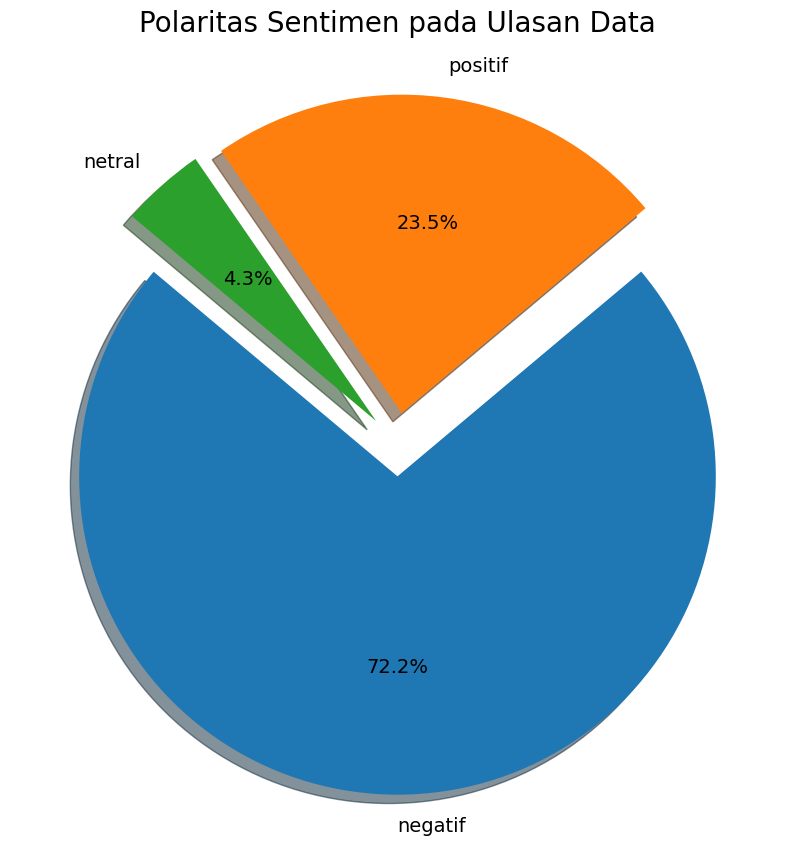

In [154]:
figure, ax = plt.subplots(figsize=(10, 10))
sizes = [count for count in clean_df['polarity_final'].value_counts()]
labels = list(clean_df['polarity_final'].value_counts().index)
explode = (0.1, 0.1, 0.1)
ax.pie(x=sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=140, textprops={'fontsize': 14})
ax.axis('equal')
plt.title('Polaritas Sentimen pada Ulasan Data', fontsize=20, pad=20)
plt.show()

In [155]:
pd.set_option('display.max_colwidth', 3000)
tweet_positif = clean_df[clean_df['polarity'] == 'positif']
tweet_positif = tweet_positif[['text_akhir', 'polarity_lexicon', 'polarity', 'stopword_clean']]
tweet_positif = tweet_positif.sort_values(by='polarity_lexicon', ascending=False)
tweet_positif = tweet_positif.reset_index(drop=True)
tweet_positif.index += 1

In [156]:
pd.set_option('display.max_colwidth', 3000)
tweet_negatif = clean_df[clean_df['polarity'] == 'negatif']
tweet_negatif = tweet_negatif[['text_akhir', 'polarity_lexicon', 'polarity', 'stopword_clean']]
tweet_negatif = tweet_negatif.sort_values(by='polarity_lexicon', ascending=False)
tweet_negatif = tweet_negatif.reset_index(drop=True)
tweet_negatif.index += 1

In [157]:
pd.set_option('display.max_colwidth', 3000)
tweet_netral = clean_df[clean_df['polarity'] == 'netral']
tweet_netral = tweet_netral[['text_akhir', 'polarity_lexicon', 'polarity', 'stopword_clean']]
tweet_netral = tweet_netral.sort_values(by='polarity_lexicon', ascending=False)
tweet_netral = tweet_netral.reset_index(drop=True)
tweet_netral.index += 1

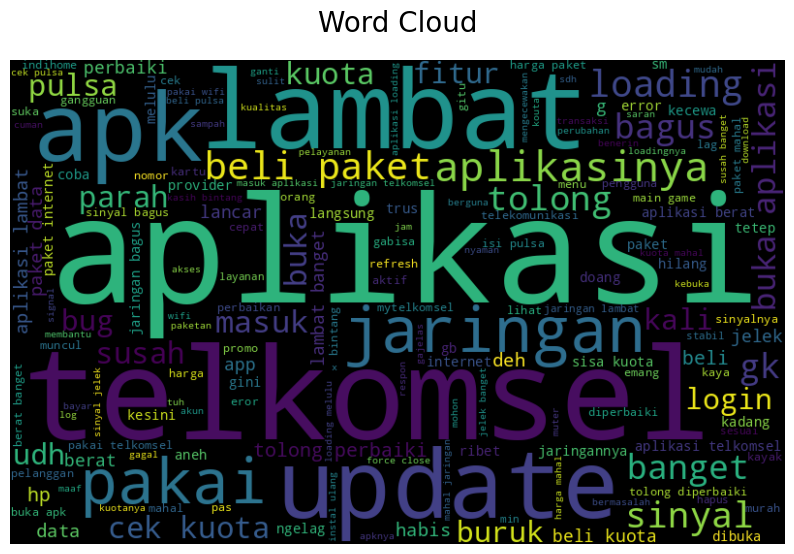

In [158]:
list_words = ''
for tweet in clean_df['stopword_clean']:
    for word in tweet:
        list_words += ' ' + (word)

wordcloud = WordCloud(width=800, height=500, background_color='black', min_font_size=10).generate(list_words)

figure, ax = plt.subplots(figsize=(10, 10))
ax.imshow(wordcloud, interpolation='bilinear')
ax.axis('off')
ax.grid(False)
ax.set_title('Word Cloud', fontsize=20, pad=20)
plt.show()

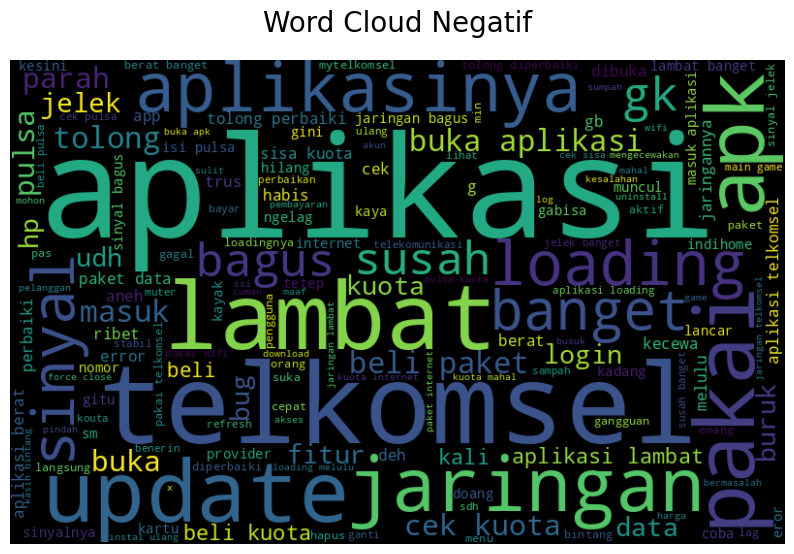

In [159]:
list_words = ''
for tweet in tweet_negatif['stopword_clean']:
    for word in tweet:
        list_words += ' ' + (word)

wordcloud = WordCloud(width=800, height=500, background_color='black', min_font_size=10).generate(list_words)

figure, ax = plt.subplots(figsize=(10, 10))
ax.imshow(wordcloud, interpolation='bilinear')
ax.axis('off')
ax.grid(False)
ax.set_title('Word Cloud Negatif', fontsize=20, pad=20)
plt.show()

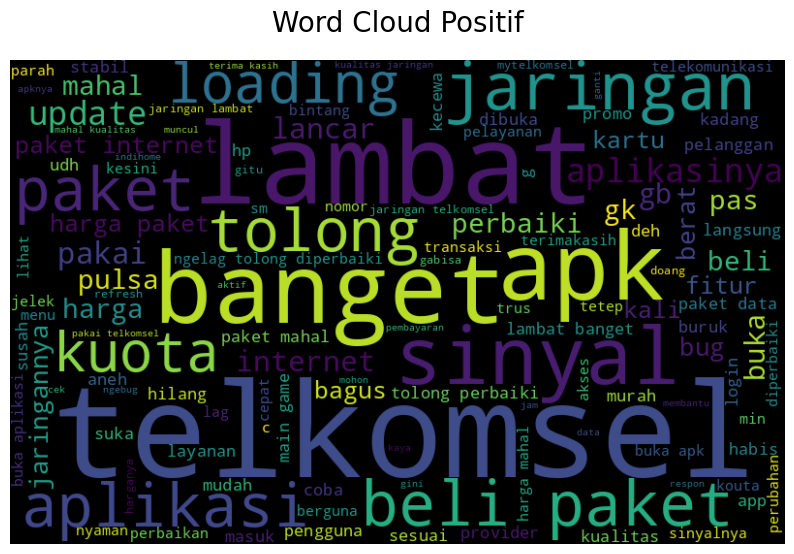

In [160]:
list_words = ''
for tweet in tweet_positif['stopword_clean']:
    for word in tweet:
        list_words += ' ' + (word)

wordcloud = WordCloud(width=800, height=500, background_color='black', min_font_size=10).generate(list_words)

figure, ax = plt.subplots(figsize=(10, 10))
ax.imshow(wordcloud, interpolation='bilinear')
ax.axis('off')
ax.grid(False)
ax.set_title('Word Cloud Positif', fontsize=20, pad=20)
plt.show()

In [161]:
from sklearn.feature_extraction.text import TfidfVectorizer

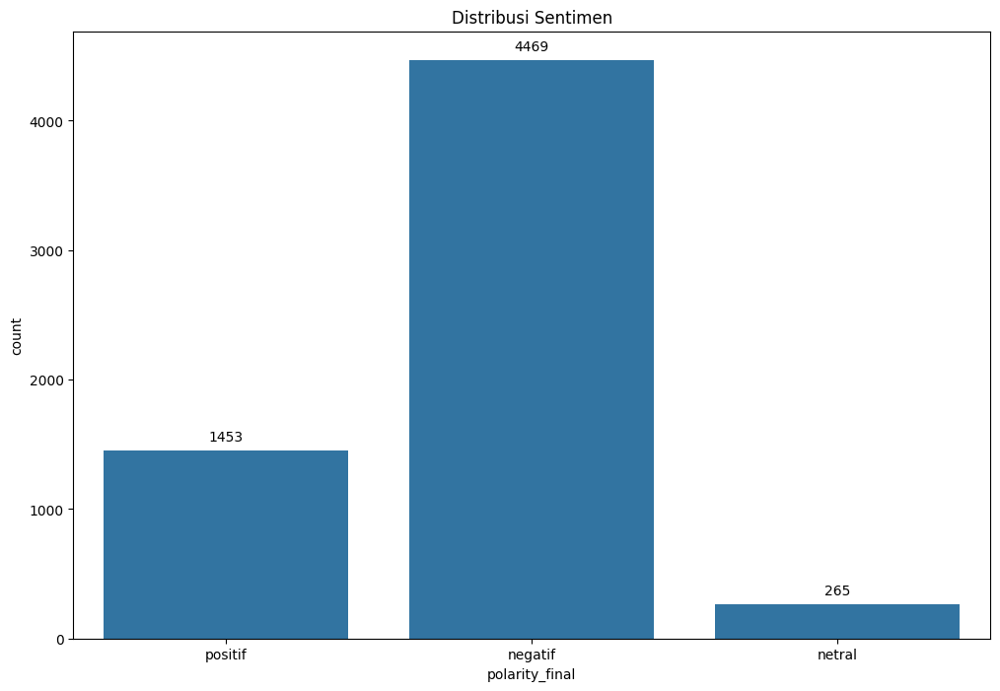

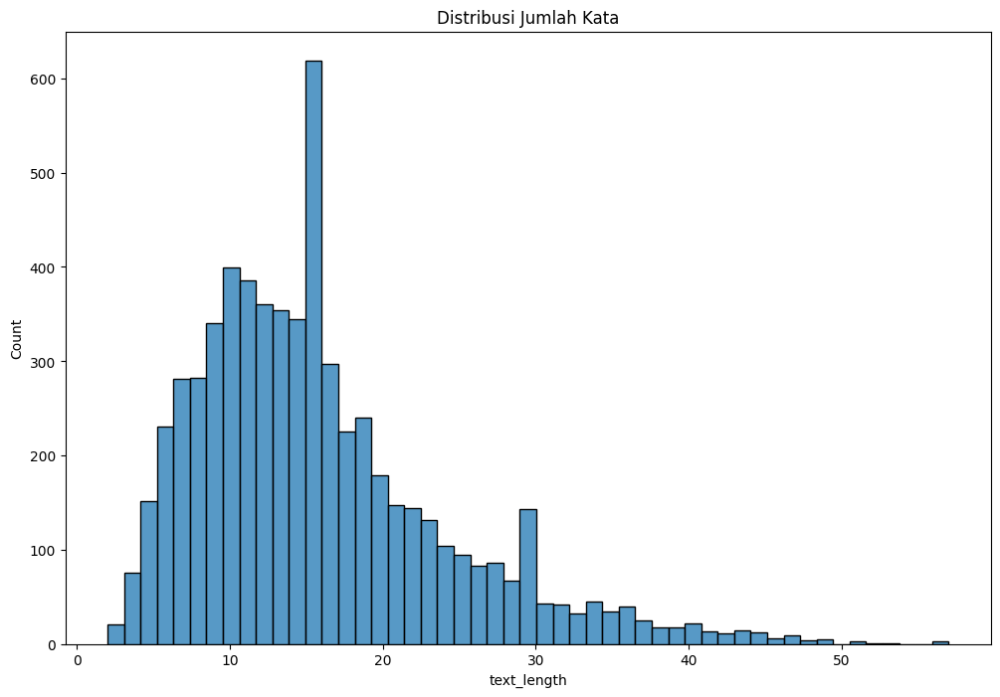

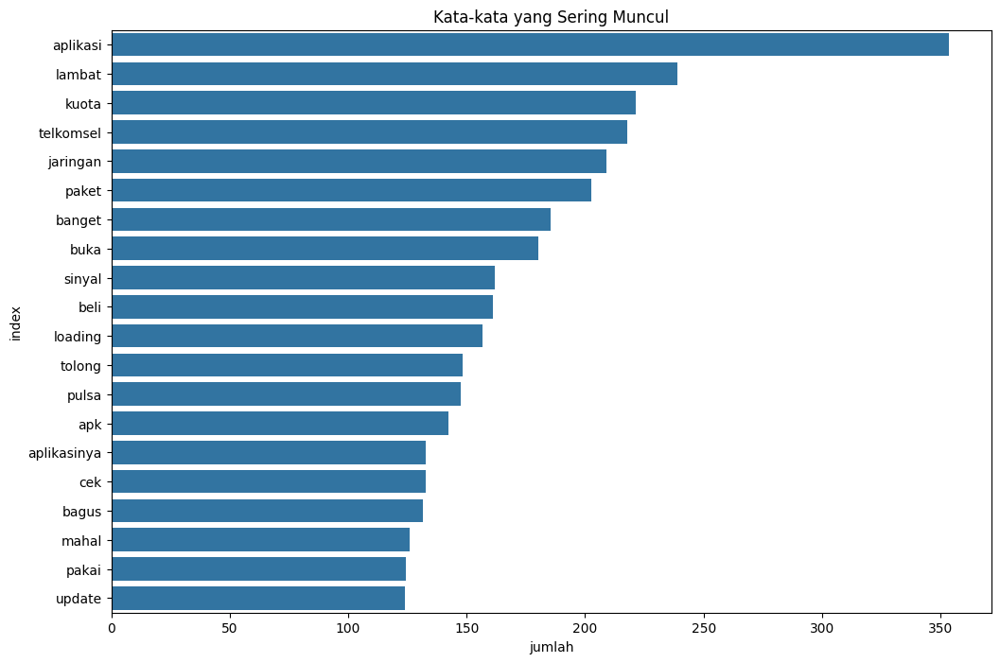

In [162]:
plt.figure(figsize=(12,8))

class_dist_plot = sns.countplot(x='polarity_final', data=clean_df)
plt.title('Distribusi Sentimen')

for p in class_dist_plot.patches:
    class_dist_plot.annotate(format(p.get_height(), '.0f'),
                             (p.get_x() + p.get_width() / 2., p.get_height()),
                             ha='center', va='center',
                             xytext=(0, 10),
                             textcoords='offset points')
plt.show()

plt.figure(figsize=(12,8))
clean_df['text_length'] = clean_df['text_akhir'].apply(lambda x: len(x.split()))
sns.histplot(clean_df['text_length'])
plt.title('Distribusi Jumlah Kata')
plt.show()

plt.figure(figsize=(12,8))
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(clean_df['text_akhir'])
tfidf_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())
tfidf_df = tfidf_df.sum().reset_index(name='jumlah')
tfidf_df = tfidf_df.sort_values('jumlah', ascending=False).head(20)
sns.barplot(x='jumlah', y='index', data=tfidf_df)
plt.title('Kata-kata yang Sering Muncul')
plt.show()

# Data Splitting

In [163]:
from sklearn.model_selection import train_test_split

In [164]:
clean_df.head(2)

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,...,clean_text,casefoldingText_clean,slangwords_clean,tokenizingText_clean,stopword_clean,text_akhir,polarity_lexicon,polarity,polarity_final,text_length
1,2c8e0f86-7cee-424d-a7ee-1bbf832a8de5,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"tidak perlu munculkan popup utk membeli paket, sangat menyebalkan. Pengguna otomatis akan membeli paket jika habis. Popup yang muncul sudah menyerupai dept collector, sangat mengganggu pengguna😭 makin malam makin lambat ini aplikasi, cuma ngecek paket data aja lama sekali terkadang malah macet",1,1701,8.7.0,2025-05-04 01:01:07,"Makasih ya Kak Masmo untuk masukannya, berharga banget untuk pengembangan versi MyTelkomsel selanjutnya. Terus pakai nomor Telkomselnya ya Kak. Salam sukses selalu :) -Ghia",2020-09-22 11:24:48,...,tidak perlu munculkan popup utk membeli paket sangat menyebalkan Pengguna otomatis akan membeli paket jika habis Popup yang muncul sudah menyerupai dept collector sangat mengganggu pengguna makin malam makin lambat ini aplikasi cuma ngecek paket data aja lama sekali terkadang malah macet,tidak perlu munculkan popup utk membeli paket sangat menyebalkan pengguna otomatis akan membeli paket jika habis popup yang muncul sudah menyerupai dept collector sangat mengganggu pengguna makin malam makin lambat ini aplikasi cuma ngecek paket data aja lama sekali terkadang malah macet,tidak perlu munculkan popup untuk membeli paket sangat menyebalkan pengguna otomatis akan membeli paket jika habis popup yang muncul sudah menyerupai dept collector sangat mengganggu pengguna makin malam makin lambat ini aplikasi cuma ngecek paket data saja lama sekali terkadang bahkan macet,"[tidak, perlu, munculkan, popup, untuk, membeli, paket, sangat, menyebalkan, pengguna, otomatis, akan, membeli, paket, jika, habis, popup, yang, muncul, sudah, menyerupai, dept, collector, sangat, mengganggu, pengguna, makin, malam, makin, lambat, ini, aplikasi, cuma, ngecek, paket, data, saja, lama, sekali, terkadang, bahkan, macet]","[munculkan, popup, membeli, paket, menyebalkan, pengguna, otomatis, membeli, paket, habis, popup, muncul, menyerupai, dept, collector, mengganggu, pengguna, malam, lambat, aplikasi, ngecek, paket, data, terkadang, macet]",munculkan popup membeli paket menyebalkan pengguna otomatis membeli paket habis popup muncul menyerupai dept collector mengganggu pengguna malam lambat aplikasi ngecek paket data terkadang macet,13,positif,positif,25
2,7554336f-d8fa-4bca-955b-e7ee03e0de8c,Pengguna Google,https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g,"terlalu banyak fitur gak berguna di MyTelkomsel, aplikasi jadi berat, loading jadi terlalu lambat, mending kalo mau tambah fitur lifestyle buat aplikasi baru aja deh, parah banget ini loadingnya soalnya. dan untuk kualitas jaringan kok sekarang jadi jelek banget ya. atau perbedaan pembelian paket data berpengaruh pada kualitas sinyal? hipotesis aja sih, tapi kok kyknya iya 🧐",1,2202,8.7.0,2025-05-01 00:42:26,"Hai Kak Fahri. Maaf bikin gak nyaman, apabila aplikasi MyTelkomsel terlalu berat di handphone kakak, silakan coba unduh MyTelkomsel Basic. Aplikasi ini sudah tersedia di PlayStore. Untuk keluhan sinyal, silakan coba restart handphone Kakak. Jika masih berkendala, yuk hubungi kami di DM Instagram @telkomsel atau chat di tsel.id/chatva. -Sekar",2025-05-01 01:28:51,...,terlalu banyak fitur gak berguna di MyTelkomsel aplikasi jadi berat loading jadi terlalu lambat mending kalo mau tambah fitur lifestyle buat aplikasi baru aja deh parah banget ini loadingnya soalnya dan untuk kualitas jaringan kok sekarang jadi jelek banget ya atau perbedaan pembelian paket data berpengaruh pada kualitas sinyal hipotesis aja sih tapi kok kyknya iya,terlalu banyak fitur gak berguna di mytelkomsel aplikasi jadi

In [165]:
X = clean_df['text_akhir']
y = clean_df['polarity_final']

In [166]:
tfidf = TfidfVectorizer(max_features=200, min_df=17, max_df=0.8)
X_tfidf = tfidf.fit_transform(X)

In [167]:
features_df = pd.DataFrame(X_tfidf.toarray(), columns=tfidf.get_feature_names_out())

features_df

,akses,aktif,akun,ampun,aneh,apk,apknya,aplikasi,aplikasinya,app,...,tuh,udh,ulang,uninstall,update,utama,verifikasi,versi,wifi,youtube
0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.101334,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.195384,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.213921,0.181749,0.000000,...,0.0,0.000000,0.0,0.000000,0.370522,0.0,0.31355,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.482184,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.236323,0.133854,0.193554,...,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6182,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.116983,0.000000,0.862305,...,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0,0.0
6183,0.0,0.0,0.0,0.0,0.0,0.466635,0.0,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.355985,0.236869,0.0,0.00000,0.0,0.0,0.0
6184,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.385151,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0,0.0
6185,0.0,0.0,0.0,0.0,0.0,0.484645,0.0,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0,0.0


In [168]:
X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y, test_size=0.2, random_state=42)

# Pemodelan

## Pemodelan CNN

In [169]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, GlobalMaxPooling1D, Dense, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [170]:
max_len = 100
max_words = 5000

tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(X)
X_seq = tokenizer.texts_to_sequences(X)
X_pad = pad_sequences(X_seq, maxlen=max_len)

y_numeric = y.apply(lambda x: 1 if x == 'positif' else 0)

X_train, X_test, y_train, y_test = train_test_split(X_pad, y_numeric, test_size=0.2, random_state=42)

model = Sequential()
model.add(Embedding(input_dim=max_words, output_dim=128, input_shape=(max_len,)))
model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

y_pred = (model.predict(X_test) > 0.5).astype("int32")

print(classification_report(y_test, y_pred))

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - accuracy: 0.7681 - loss: 0.5309 - val_accuracy: 0.8485 - val_loss: 0.3366
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - accuracy: 0.8844 - loss: 0.2878 - val_accuracy: 0.8586 - val_loss: 0.2829
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - accuracy: 0.9402 - loss: 0.1684 - val_accuracy: 0.8828 - val_loss: 0.2813
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - accuracy: 0.9632 - loss: 0.0973 - val_accuracy: 0.8788 - val_loss: 0.3058
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - accuracy: 0.9810 - loss: 0.0522 - val_accuracy: 0.8909 - val_loss: 0.3072
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - accuracy: 0.9872 - loss: 0.0352 - val_accuracy: 0.8848 - val_loss: 0.3424
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - accuracy: 0.9941 - loss: 0.0246 - val_accuracy: 0.8808 - val_loss: 0.3561
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - accuracy: 0.9961 - loss: 0.0179 - val_accuracy: 0.882

## Pemodelan LSTM

In [171]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, Reshape
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [172]:
y_numeric = y.apply(lambda x: 1 if x == 'positif' else 0)

tfidf = TfidfVectorizer(max_features=200, min_df=17, max_df=0.8)
X_tfidf = tfidf.fit_transform(X)

X_array = X_tfidf.toarray()
X_lstm = X_array.reshape((X_array.shape[0], 1, X_array.shape[1]))

X_train, X_test, y_train, y_test = train_test_split(X_lstm, y_numeric, test_size=0.2, random_state=42)

model = Sequential()
model.add(LSTM(128, input_shape=(1, X_lstm.shape[2])))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

y_pred = (model.predict(X_test) > 0.5).astype("int32")

print(classification_report(y_test, y_pred))

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


140/140 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7386 - loss: 0.6148 - val_accuracy: 0.7616 - val_loss: 0.4797
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7698 - loss: 0.4468 - val_accuracy: 0.8040 - val_loss: 0.3984
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8283 - loss: 0.3597 - val_accuracy: 0.8444 - val_loss: 0.3329
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8760 - loss: 0.2961 - val_accuracy: 0.8626 - val_loss: 0.3010
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8939 - loss: 0.2672 - val_accuracy: 0.8808 - val_loss: 0.2872
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8957 - loss: 0.2549 - val_accuracy: 0.8808 - val_loss: 0.2811
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9030 - loss: 0.2466 - val_accuracy: 0.8848 - val_loss: 0.2777
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9034 - loss: 0.2405 - val_accuracy: 0.8848 - val_

## Pemodelan LSTM

In [173]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [174]:
max_len = 100
max_words = 5000

tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(X)
X_seq = tokenizer.texts_to_sequences(X)
X_pad = pad_sequences(X_seq, maxlen=max_len)

y_numeric = y.apply(lambda x: 1 if x == 'positif' else 0)

X_train, X_test, y_train, y_test = train_test_split(X_pad, y_numeric, test_size=0.2, random_state=42)

model = Sequential()
model.add(Embedding(input_dim=max_words, output_dim=128, input_shape=(max_len,)))
model.add(LSTM(128, dropout=0.2, recurrent_dropout=0.2))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

y_pred = (model.predict(X_test) > 0.5).astype("int32")

print(classification_report(y_test, y_pred))

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - accuracy: 0.7590 - loss: 0.5447 - val_accuracy: 0.8606 - val_loss: 0.3292
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - accuracy: 0.8970 - loss: 0.2498 - val_accuracy: 0.9030 - val_loss: 0.2508
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - accuracy: 0.9514 - loss: 0.1269 - val_accuracy: 0.8949 - val_loss: 0.3122
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - accuracy: 0.9731 - loss: 0.0711 - val_accuracy: 0.8747 - val_loss: 0.4596
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - accuracy: 0.9843 - loss: 0.0446 - val_accuracy: 0.8869 - val_loss: 0.4020
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - accuracy: 0.9890 - loss: 0.0305 - val_accuracy: 0.9010 - val_loss: 0.4094
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - accuracy: 0.9934 - loss: 0.0254 - val_accuracy: 0.8929 - val_loss: 0.5025
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - accuracy: 0.9895 - loss: 0.0315 - val